In [2]:
from tensorflow.python.client import device_lib
local_device_protos = device_lib.list_local_devices()
local_device_protos

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 5465108824730483481, name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 4816189224411522314
 physical_device_desc: "device: XLA_CPU device", name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 3147189345394769334
 physical_device_desc: "device: XLA_GPU device", name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 15956161332
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 12759620731713955721
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"]

In [3]:
import tensorflow as tf
print('Eager Execution On ->', tf.executing_eagerly())
print('Tensorflow Version ->', tf.__version__)

Eager Execution On -> True
Tensorflow Version -> 2.0.0


In [0]:
from config import *
from src.utils import *
from src.dataset import *
from src.models import *
from src.losses import *
from src.training import *

In [5]:
path = download_existing_dataset(EXISTING_DATASETS['maps'], 'maps')
print('Dataset Path ->', path)

250249216/250242400 [==============================] - 13s 0us/step
Dataset Path -> /root/.keras/datasets/maps


In [6]:
!mv /root/.keras/datasets/maps/val /root/.keras/datasets/maps/test
!ls /root/.keras/datasets/maps

test  train


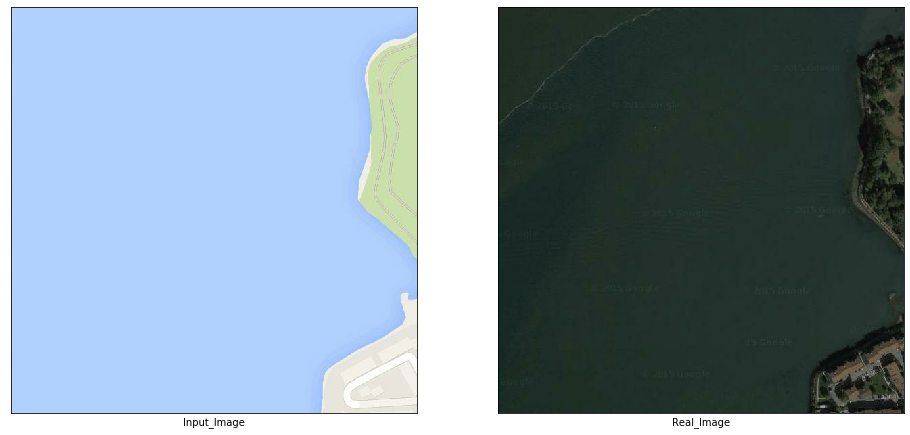

In [7]:
visualize(join(path, 'train/200.jpg'))

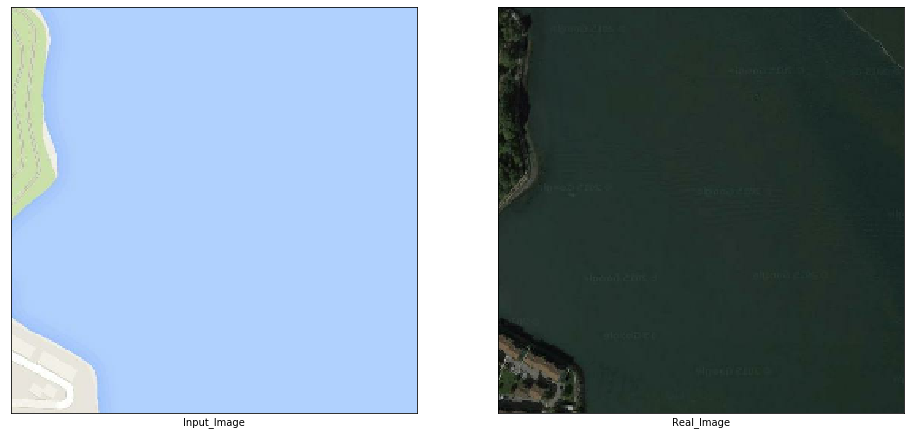

In [8]:
visualize(join(path, 'train/200.jpg'), augment=True)

In [9]:
train_dataset, test_dataset = get_datasets(path)
print(train_dataset)
print(test_dataset)

<DatasetV1Adapter shapes: ((None, 256, 256, 3), (None, 256, 256, 3)), types: (tf.float32, tf.float32)>
<DatasetV1Adapter shapes: ((None, 256, 256, None), (None, 256, 256, None)), types: (tf.float32, tf.float32)>


In [10]:
generator = Generator()
generator.summary()

Model: "Generator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, None, None, 6 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, None, None, 1 131584      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, None, None, 2 525312      sequential_1[0][0]               
__________________________________________________________________________________________

In [11]:
discriminator = Discriminator()
discriminator.summary()

Model: "Discriminator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, None, None,  0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, None, None,  0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, None, None, 6 0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_15 (Sequential)      (None, None, None, 6 6144        concatenate_1[0][0]  

In [0]:
discriminator_optimizer, generator_optimizer = get_optimizers()
checkpoint, checkpoint_prefix = get_checkpoint(
    discriminator, generator,
    discriminator_optimizer,
    generator_optimizer
)

0it [00:00, ?it/s]

Epoch 1 going on....


1096it [01:09, 15.69it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 1 is 69.844167470932 sec

Epoch 2 going on....


1096it [01:02, 17.58it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 2 is 62.34953451156616 sec

Epoch 3 going on....


1096it [01:02, 18.40it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 3 is 62.326730728149414 sec

Epoch 4 going on....


1096it [01:02, 17.58it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 4 is 62.34071660041809 sec

Epoch 5 going on....


1096it [01:02, 17.58it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 5 is 62.340272426605225 sec

Epoch 6 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 6 is 62.39980697631836 sec

Epoch 7 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 7 is 62.3191921710968 sec

Epoch 8 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 8 is 62.37630534172058 sec

Epoch 9 going on....


1096it [01:02, 17.58it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 9 is 62.34322643280029 sec

Epoch 10 going on....


1096it [01:02, 17.61it/s]


Completed.


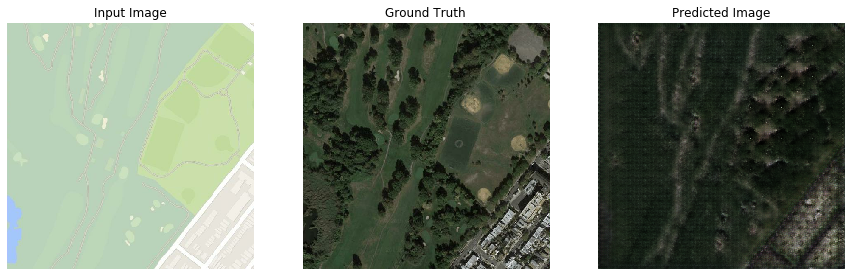

0it [00:00, ?it/s]

Time taken for epoch 10 is 62.721452713012695 sec

Epoch 11 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 11 is 62.398390769958496 sec

Epoch 12 going on....


1096it [01:02, 17.48it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 12 is 62.71614122390747 sec

Epoch 13 going on....


1096it [01:02, 17.49it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 13 is 62.672375440597534 sec

Epoch 14 going on....


1096it [01:02, 17.52it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 14 is 62.572094440460205 sec

Epoch 15 going on....


1096it [01:02, 17.51it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 15 is 62.60001540184021 sec

Epoch 16 going on....


1096it [01:02, 17.48it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 16 is 62.718238830566406 sec

Epoch 17 going on....


1096it [01:02, 17.49it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 17 is 62.66975736618042 sec

Epoch 18 going on....


1096it [01:02, 17.49it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 18 is 62.66923141479492 sec

Epoch 19 going on....


1096it [01:02, 17.51it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 19 is 62.595365047454834 sec

Epoch 20 going on....


1096it [01:02, 17.64it/s]


Completed.


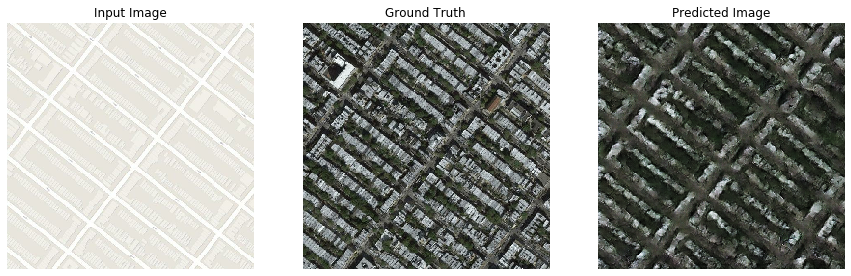

0it [00:00, ?it/s]

Time taken for epoch 20 is 62.627134799957275 sec

Epoch 21 going on....


1096it [01:02, 17.65it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 21 is 62.11296796798706 sec

Epoch 22 going on....


1096it [01:02, 17.64it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 22 is 62.11672019958496 sec

Epoch 23 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 23 is 62.29670071601868 sec

Epoch 24 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 24 is 62.319156885147095 sec

Epoch 25 going on....


1096it [01:02, 18.45it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 25 is 62.34392952919006 sec

Epoch 26 going on....


1096it [01:02, 17.61it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 26 is 62.25321078300476 sec

Epoch 27 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 27 is 62.311906576156616 sec

Epoch 28 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 28 is 62.27171277999878 sec

Epoch 29 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 29 is 62.26339387893677 sec

Epoch 30 going on....


1096it [01:02, 17.61it/s]


Completed.


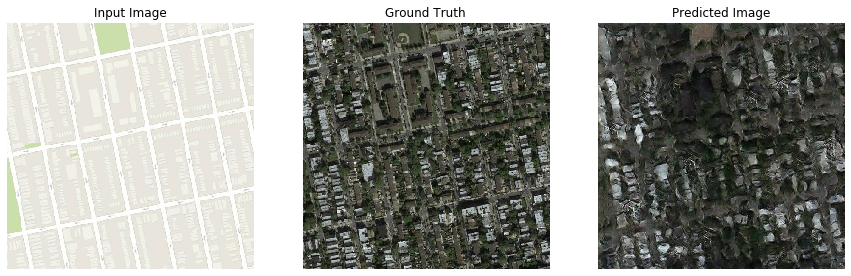

0it [00:00, ?it/s]

Time taken for epoch 30 is 62.721169233322144 sec

Epoch 31 going on....


1096it [01:02, 17.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 31 is 62.492616415023804 sec

Epoch 32 going on....


1096it [01:02, 18.50it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 32 is 62.4079647064209 sec

Epoch 33 going on....


1096it [01:02, 17.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 33 is 62.175944328308105 sec

Epoch 34 going on....


1096it [01:02, 18.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 34 is 62.07805633544922 sec

Epoch 35 going on....


1096it [01:02, 18.51it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 35 is 62.07310128211975 sec

Epoch 36 going on....


1096it [01:02, 17.65it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 36 is 62.08670926094055 sec

Epoch 37 going on....


1096it [01:01, 17.68it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 37 is 61.99406170845032 sec

Epoch 38 going on....


1096it [01:01, 17.68it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 38 is 61.99369168281555 sec

Epoch 39 going on....


1096it [01:01, 17.72it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 39 is 61.86953377723694 sec

Epoch 40 going on....


1096it [01:02, 17.64it/s]


Completed.


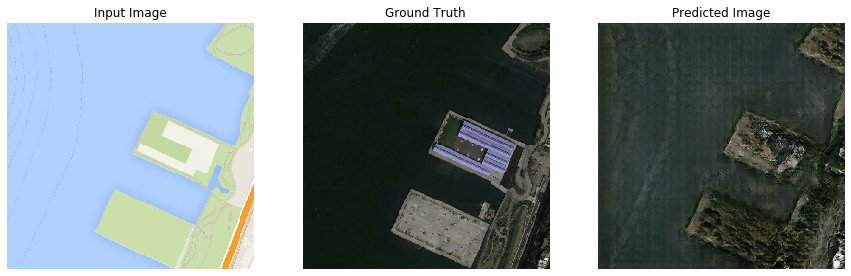

0it [00:00, ?it/s]

Time taken for epoch 40 is 62.59948134422302 sec

Epoch 41 going on....


1096it [01:02, 17.61it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 41 is 62.2293906211853 sec

Epoch 42 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 42 is 62.277747631073 sec

Epoch 43 going on....


1096it [01:02, 17.58it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 43 is 62.3431658744812 sec

Epoch 44 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 44 is 62.295642614364624 sec

Epoch 45 going on....


1096it [01:02, 18.52it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 45 is 62.331337451934814 sec

Epoch 46 going on....


1096it [01:02, 17.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 46 is 62.16495060920715 sec

Epoch 47 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 47 is 62.032875299453735 sec

Epoch 48 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 48 is 62.02130389213562 sec

Epoch 49 going on....


1096it [01:02, 17.66it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 49 is 62.07568669319153 sec

Epoch 50 going on....


1096it [01:02, 18.47it/s]


Completed.


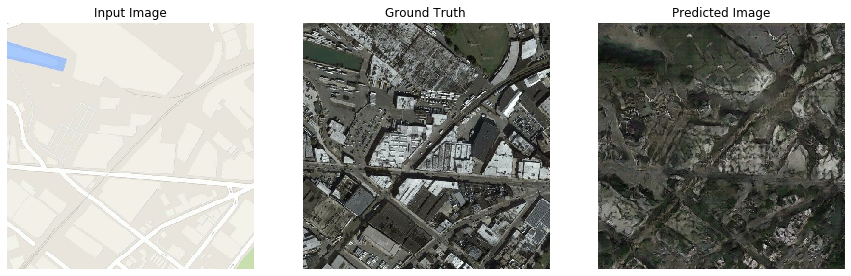

0it [00:00, ?it/s]

Time taken for epoch 50 is 62.64629793167114 sec

Epoch 51 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 51 is 62.386595487594604 sec

Epoch 52 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 52 is 62.279778718948364 sec

Epoch 53 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 53 is 62.261247396469116 sec

Epoch 54 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 54 is 62.274744272232056 sec

Epoch 55 going on....


1096it [01:02, 18.41it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 55 is 62.43280267715454 sec

Epoch 56 going on....


1096it [01:02, 17.55it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 56 is 62.44940805435181 sec

Epoch 57 going on....


1096it [01:02, 17.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 57 is 62.49855327606201 sec

Epoch 58 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 58 is 62.31230187416077 sec

Epoch 59 going on....


1096it [01:02, 17.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 59 is 62.184850215911865 sec

Epoch 60 going on....


1096it [01:02, 17.59it/s]


Completed.


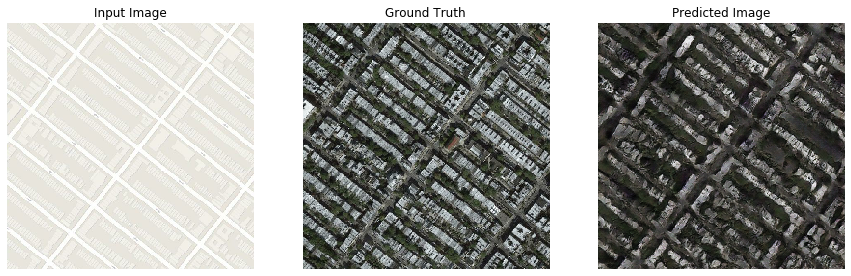

0it [00:00, ?it/s]

Time taken for epoch 60 is 62.80665564537048 sec

Epoch 61 going on....


1096it [01:02, 18.38it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 61 is 62.454227924346924 sec

Epoch 62 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 62 is 62.28777718544006 sec

Epoch 63 going on....


1096it [01:02, 18.49it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 63 is 62.342047929763794 sec

Epoch 64 going on....


1096it [01:02, 17.58it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 64 is 62.35460376739502 sec

Epoch 65 going on....


1096it [01:02, 17.51it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 65 is 62.594887495040894 sec

Epoch 66 going on....


1096it [01:02, 17.52it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 66 is 62.55020880699158 sec

Epoch 67 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 67 is 62.310773849487305 sec

Epoch 68 going on....


1096it [01:02, 18.52it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 68 is 62.24419975280762 sec

Epoch 69 going on....


1096it [01:02, 17.65it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 69 is 62.11603021621704 sec

Epoch 70 going on....


1096it [01:01, 17.68it/s]


Completed.


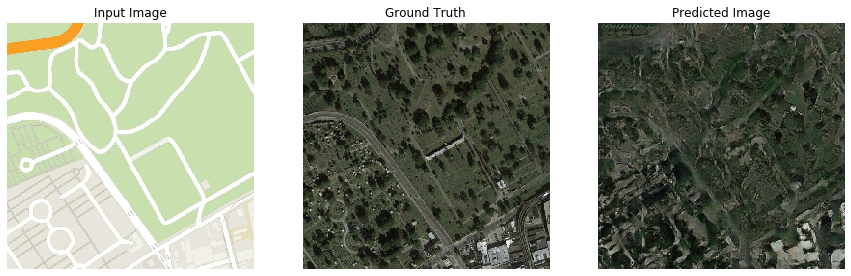

0it [00:00, ?it/s]

Time taken for epoch 70 is 62.45390820503235 sec

Epoch 71 going on....


1096it [01:02, 17.66it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 71 is 62.045920848846436 sec

Epoch 72 going on....


1096it [01:02, 17.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 72 is 62.168344497680664 sec

Epoch 73 going on....


1096it [01:02, 17.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 73 is 62.17161464691162 sec

Epoch 74 going on....


1096it [01:02, 17.61it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 74 is 62.23587417602539 sec

Epoch 75 going on....


1096it [01:02, 17.64it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 75 is 62.11985158920288 sec

Epoch 76 going on....


1096it [01:01, 17.68it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 76 is 61.97698187828064 sec

Epoch 77 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 77 is 62.04361009597778 sec

Epoch 78 going on....


1096it [01:02, 17.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 78 is 62.17530179023743 sec

Epoch 79 going on....


1096it [01:02, 17.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 79 is 62.48435664176941 sec

Epoch 80 going on....


1096it [01:02, 17.60it/s]


Completed.


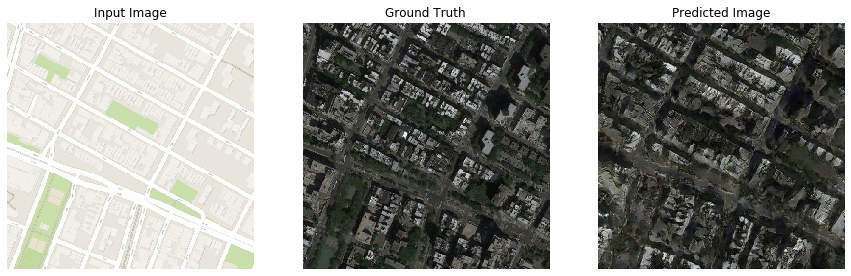

0it [00:00, ?it/s]

Time taken for epoch 80 is 62.75775647163391 sec

Epoch 81 going on....


1096it [01:02, 17.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 81 is 62.47938251495361 sec

Epoch 82 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 82 is 62.403791189193726 sec

Epoch 83 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 83 is 62.373225688934326 sec

Epoch 84 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 84 is 62.42734146118164 sec

Epoch 85 going on....


1096it [01:02, 17.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 85 is 62.49196267127991 sec

Epoch 86 going on....


1096it [01:02, 17.58it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 86 is 62.344332218170166 sec

Epoch 87 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 87 is 62.38521099090576 sec

Epoch 88 going on....


1096it [01:02, 17.55it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 88 is 62.44119334220886 sec

Epoch 89 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 89 is 62.37140417098999 sec

Epoch 90 going on....


1096it [01:02, 17.58it/s]


Completed.


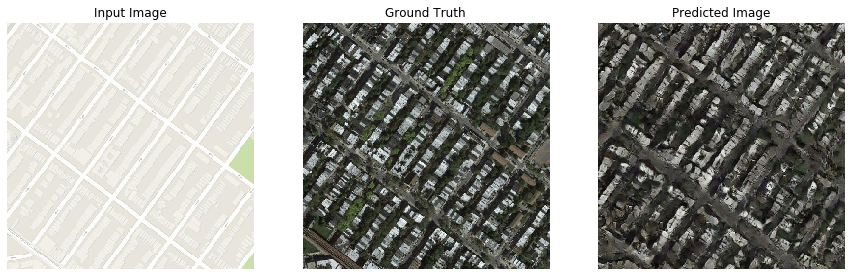

0it [00:00, ?it/s]

Time taken for epoch 90 is 62.83552813529968 sec

Epoch 91 going on....


1096it [01:02, 17.55it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 91 is 62.44700312614441 sec

Epoch 92 going on....


1096it [01:02, 18.36it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 92 is 62.37293767929077 sec

Epoch 93 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 93 is 62.38942050933838 sec

Epoch 94 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 94 is 62.394901752471924 sec

Epoch 95 going on....


1096it [01:02, 17.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 95 is 62.48669385910034 sec

Epoch 96 going on....


1096it [01:02, 17.62it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 96 is 62.19385027885437 sec

Epoch 97 going on....


1096it [01:02, 17.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 97 is 62.16715049743652 sec

Epoch 98 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 98 is 62.27420377731323 sec

Epoch 99 going on....


1096it [01:02, 18.39it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 99 is 62.22683262825012 sec

Epoch 100 going on....


1096it [01:02, 17.63it/s]


Completed.


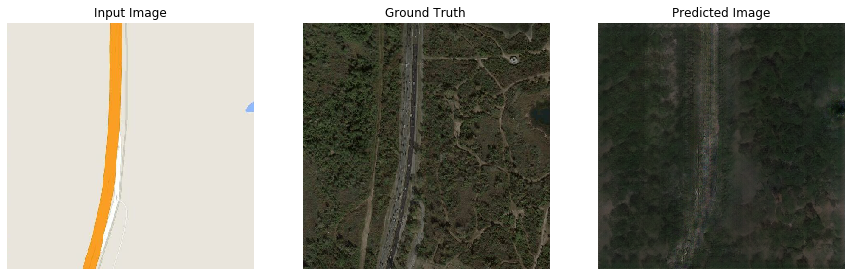

0it [00:00, ?it/s]

Time taken for epoch 100 is 62.61917161941528 sec

Epoch 101 going on....


1096it [01:01, 17.71it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 101 is 61.88919472694397 sec

Epoch 102 going on....


1096it [01:01, 17.72it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 102 is 61.839229583740234 sec

Epoch 103 going on....


1096it [01:01, 17.71it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 103 is 61.88451886177063 sec

Epoch 104 going on....


1096it [01:01, 17.70it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 104 is 61.93994188308716 sec

Epoch 105 going on....


1096it [01:01, 17.70it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 105 is 61.93826246261597 sec

Epoch 106 going on....


1096it [01:01, 18.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 106 is 61.970882177352905 sec

Epoch 107 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 107 is 62.42047095298767 sec

Epoch 108 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 108 is 62.4093074798584 sec

Epoch 109 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 109 is 62.36736845970154 sec

Epoch 110 going on....


1096it [01:02, 17.57it/s]


Completed.


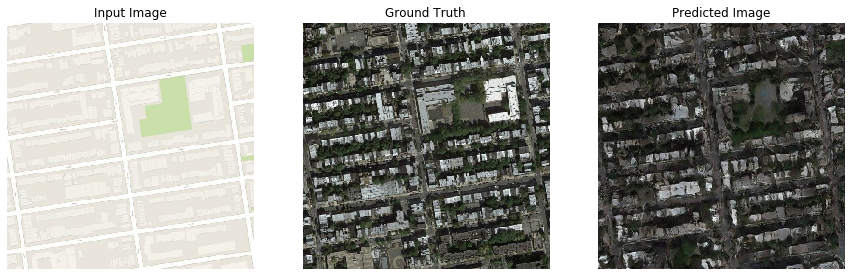

0it [00:00, ?it/s]

Time taken for epoch 110 is 62.85381531715393 sec

Epoch 111 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 111 is 62.420448303222656 sec

Epoch 112 going on....


1096it [01:02, 17.62it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 112 is 62.19403600692749 sec

Epoch 113 going on....


1096it [01:02, 17.63it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 113 is 62.17932653427124 sec

Epoch 114 going on....


1096it [01:02, 18.52it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 114 is 62.134517192840576 sec

Epoch 115 going on....


1096it [01:02, 18.47it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 115 is 62.12714982032776 sec

Epoch 116 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 116 is 62.30011200904846 sec

Epoch 117 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 117 is 62.40836787223816 sec

Epoch 118 going on....


1096it [01:02, 17.51it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 118 is 62.59024453163147 sec

Epoch 119 going on....


1096it [01:02, 17.52it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 119 is 62.57830357551575 sec

Epoch 120 going on....


1096it [01:02, 17.51it/s]


Completed.


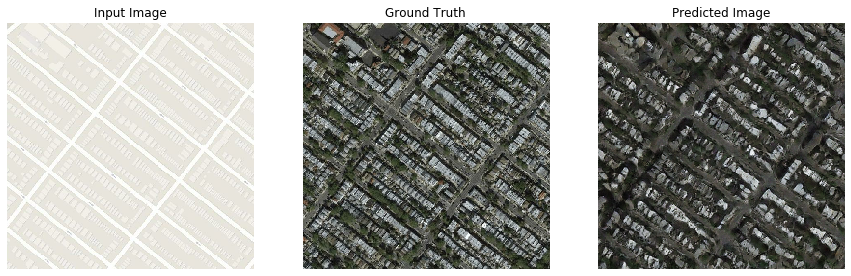

0it [00:00, ?it/s]

Time taken for epoch 120 is 63.08588743209839 sec

Epoch 121 going on....


1096it [01:02, 17.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 121 is 62.496697425842285 sec

Epoch 122 going on....


1096it [01:02, 17.55it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 122 is 62.45647215843201 sec

Epoch 123 going on....


1096it [01:02, 17.53it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 123 is 62.51265287399292 sec

Epoch 124 going on....


1096it [01:02, 17.59it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 124 is 62.32877469062805 sec

Epoch 125 going on....


1096it [01:02, 17.60it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 125 is 62.260159492492676 sec

Epoch 126 going on....


1096it [01:02, 17.62it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 126 is 62.215988874435425 sec

Epoch 127 going on....


1096it [01:02, 17.57it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 127 is 62.395081996917725 sec

Epoch 128 going on....


1096it [01:02, 17.52it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 128 is 62.5642945766449 sec

Epoch 129 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 129 is 62.432862997055054 sec

Epoch 130 going on....


1096it [01:02, 17.59it/s]


Completed.


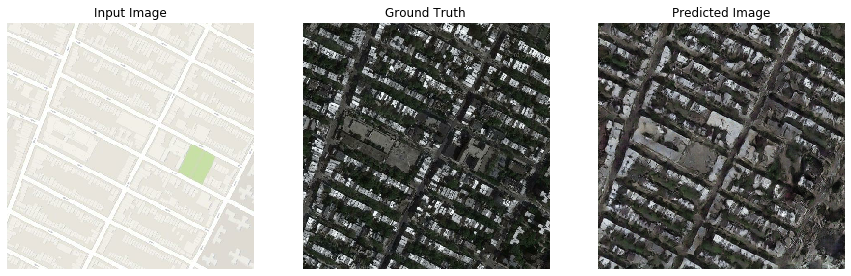

0it [00:00, ?it/s]

Time taken for epoch 130 is 62.79969501495361 sec

Epoch 131 going on....


1096it [01:02, 17.58it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 131 is 62.34340190887451 sec

Epoch 132 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 132 is 62.42083406448364 sec

Epoch 133 going on....


1096it [01:02, 17.54it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 133 is 62.50519609451294 sec

Epoch 134 going on....


1096it [01:02, 17.56it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 134 is 62.41108155250549 sec

Epoch 135 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 135 is 62.023521900177 sec

Epoch 136 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 136 is 62.01545000076294 sec

Epoch 137 going on....


1096it [01:02, 17.68it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 137 is 62.004026651382446 sec

Epoch 138 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 138 is 62.03214502334595 sec

Epoch 139 going on....


1096it [01:01, 17.71it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 139 is 61.9044075012207 sec

Epoch 140 going on....


1096it [01:01, 17.70it/s]


Completed.


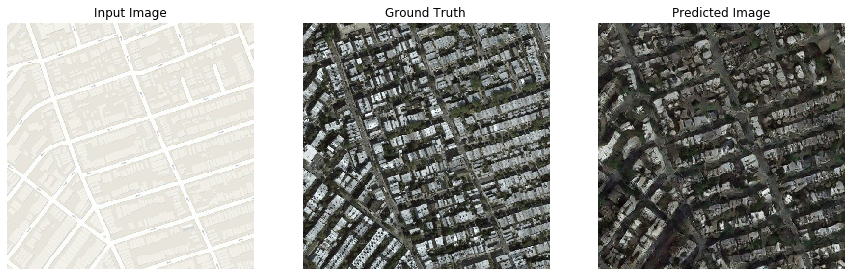

0it [00:00, ?it/s]

Time taken for epoch 140 is 62.399951219558716 sec

Epoch 141 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 141 is 62.02218270301819 sec

Epoch 142 going on....


1096it [01:01, 17.70it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 142 is 61.92385411262512 sec

Epoch 143 going on....


1096it [01:02, 17.68it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 143 is 62.00332593917847 sec

Epoch 144 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 144 is 62.02277135848999 sec

Epoch 145 going on....


1096it [01:02, 17.67it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 145 is 62.01683282852173 sec

Epoch 146 going on....


1096it [01:01, 18.53it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 146 is 62.003559589385986 sec

Epoch 147 going on....


1096it [01:02, 17.65it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 147 is 62.08172297477722 sec

Epoch 148 going on....


1096it [01:01, 17.71it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 148 is 61.884785413742065 sec

Epoch 149 going on....


1096it [01:01, 17.71it/s]
0it [00:00, ?it/s]

Completed.
Time taken for epoch 149 is 61.888264656066895 sec

Epoch 150 going on....


1096it [01:01, 17.71it/s]


Completed.


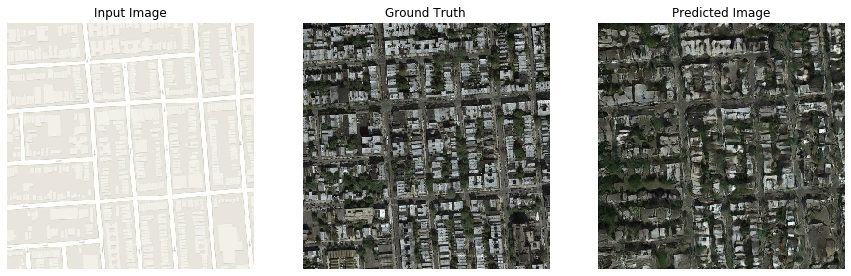

Time taken for epoch 150 is 62.34784722328186 sec



In [13]:
generator_loss_history, discriminator_loss_history = train(
    discriminator, generator,
    discriminator_optimizer,
    generator_optimizer,
    train_dataset, test_dataset,
    checkpoint, checkpoint_prefix
)

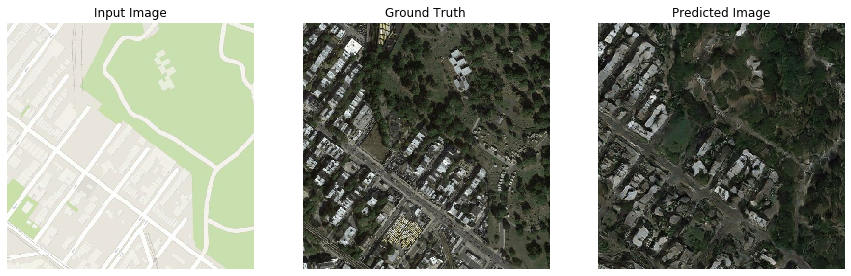

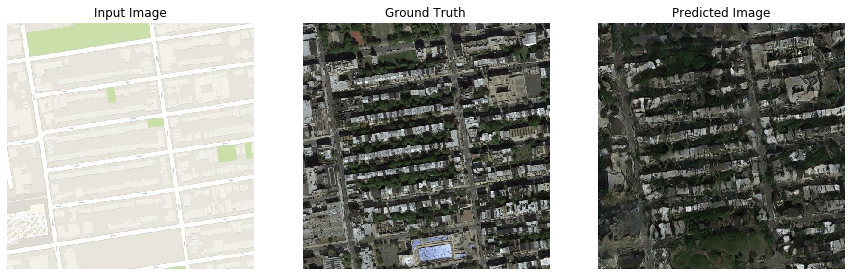

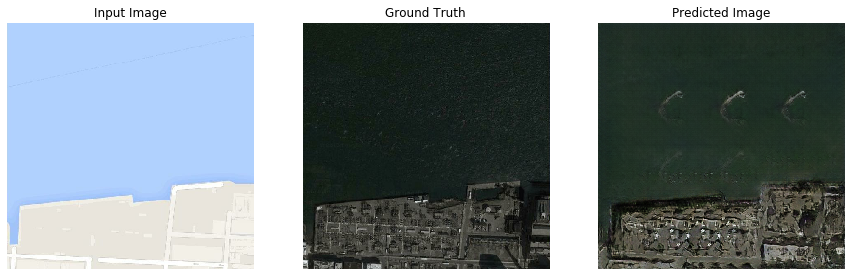

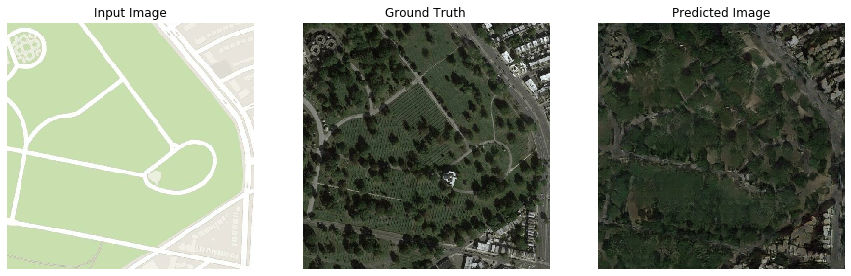

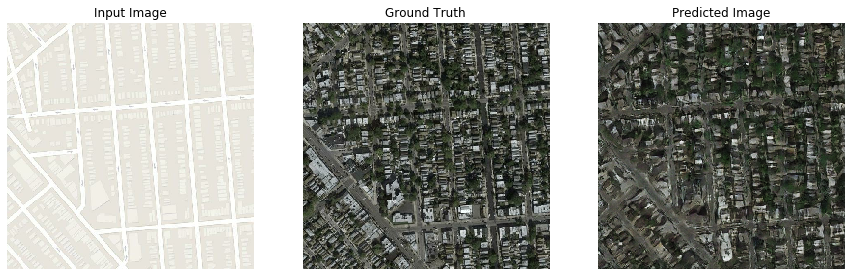

In [14]:
for _input, _target in test_dataset.take(5):
    generate_images(generator, _input, _target)